In [1]:
!pip install torch torchvision
!pip install numpy pandas matplotlib pillow scikit-learn img2vec-pytorch

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [2]:
import torch
import torch.nn as nn
import torchvision.models as models
from PIL import Image
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from torchvision import transforms
import pandas as pd
from PIL import Image
import os
from img2vec_pytorch import Img2Vec
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


In [3]:
torch.cuda.is_available()

True

In [4]:
folder_path = '../scratch/ml2_data/20251214_140311'
images = []
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg'):
        img_path = os.path.join(folder_path, filename)
        img = Image.open(img_path)
        width, height = img.size
        cropped_img = img.crop((100, 100, width, height))
        images.append(cropped_img)
        

In [5]:
len(images)

1554

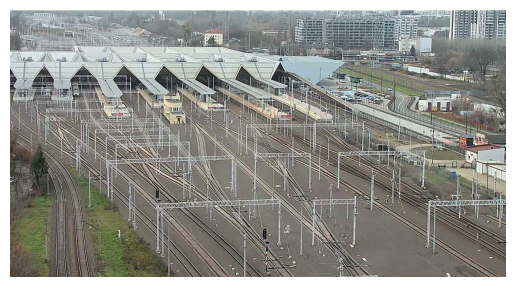

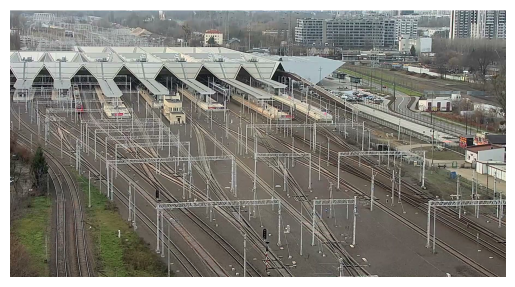

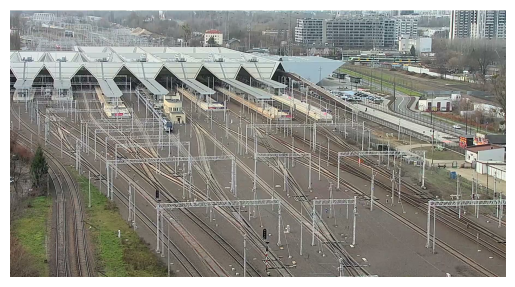

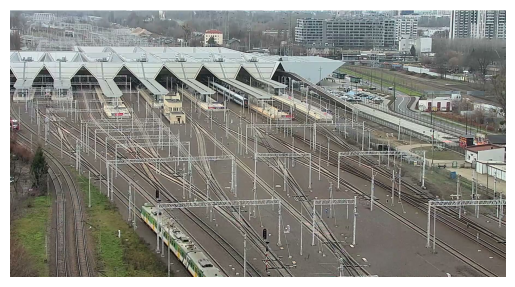

In [6]:
for i in [0,500,1000,1500]:
    plt.imshow(images[i])
    plt.axis('off')
    plt.show()

In [7]:
encoder = Img2Vec(model='alexnet',cuda=True)
vectors = encoder.get_vec(images)

In [8]:
vectors.shape

(1554, 4096)

In [9]:
from sklearn.model_selection import train_test_split

idexes = np.arange(len(images))
train_idxs, test_idxs = train_test_split(
    idexes,
    test_size=0.2, 
    random_state=42 
)

train_images = np.array([images[x] for x in train_idxs])
train_vectors =  np.array([vectors[x] for x in train_idxs])

test_images =  np.array([images[x] for x in test_idxs])
test_vectors =  np.array([vectors[x] for x in test_idxs])

In [10]:
train_vectors.shape

(1243, 4096)

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [12]:
from torch.utils.data import DataLoader, TensorDataset
train_tensor = torch.tensor(train_vectors, dtype=torch.float32)
test_tensor  = torch.tensor(test_vectors, dtype=torch.float32)

dataset = TensorDataset(train_tensor)
loader = DataLoader(dataset, batch_size=32, shuffle=True)

In [22]:
class AutoEncoder(nn.Module):
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Linear(4096, 1024),
            nn.ReLU(),
            nn.Linear(1024, 256),
            nn.ReLU(),
            nn.Linear(256, 64),
            nn.ReLU(),
            nn.Linear(64, 16)
        )
        
        self.decoder = nn.Sequential(
            nn.Linear(16, 64),
            nn.ReLU(),
            nn.Linear(64, 256),
            nn.ReLU(),
            nn.Linear(256, 1024),
            nn.ReLU(),
            nn.Linear(1024, 4096)
        )

    def forward(self, x):
        latent = self.encoder(x)
        reconstructed = self.decoder(latent)
        return reconstructed

    def get_latent(self,x):
        latent = self.encoder(x)
        return latent

In [23]:
model = AutoEncoder().to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters())

In [24]:
num_epochs = 60
train_losses = []
test_losses = []

for epoch in range(num_epochs):
    model.train()
    total_train_loss = 0.0
    
    for (x,) in loader:
        x = x.to(device)
        optimizer.zero_grad()
        x_recon = model(x)
        loss = criterion(x_recon, x)
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()
    
    avg_train_loss = total_train_loss / len(loader)
    train_losses.append(avg_train_loss)
    
    # Compute test loss
    model.eval()
    with torch.no_grad():
        test_recon = model(test_tensor.to(device))
        test_loss = criterion(test_recon, test_tensor.to(device)).item()
        test_losses.append(test_loss)
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.6f}, Test Loss: {test_loss:.6f}")

Epoch [1/60], Train Loss: 0.301905, Test Loss: 0.082248
Epoch [2/60], Train Loss: 0.080367, Test Loss: 0.078356
Epoch [3/60], Train Loss: 0.079259, Test Loss: 0.077932
Epoch [4/60], Train Loss: 0.079257, Test Loss: 0.079273
Epoch [5/60], Train Loss: 0.079417, Test Loss: 0.077885
Epoch [6/60], Train Loss: 0.078919, Test Loss: 0.077352
Epoch [7/60], Train Loss: 0.079079, Test Loss: 0.078053
Epoch [8/60], Train Loss: 0.079086, Test Loss: 0.079319
Epoch [9/60], Train Loss: 0.078778, Test Loss: 0.073518
Epoch [10/60], Train Loss: 0.066613, Test Loss: 0.061715
Epoch [11/60], Train Loss: 0.057165, Test Loss: 0.050275
Epoch [12/60], Train Loss: 0.047828, Test Loss: 0.046933
Epoch [13/60], Train Loss: 0.045398, Test Loss: 0.046422
Epoch [14/60], Train Loss: 0.043502, Test Loss: 0.044214
Epoch [15/60], Train Loss: 0.042141, Test Loss: 0.041587
Epoch [16/60], Train Loss: 0.041436, Test Loss: 0.041938
Epoch [17/60], Train Loss: 0.039147, Test Loss: 0.040225
Epoch [18/60], Train Loss: 0.036630, Tes

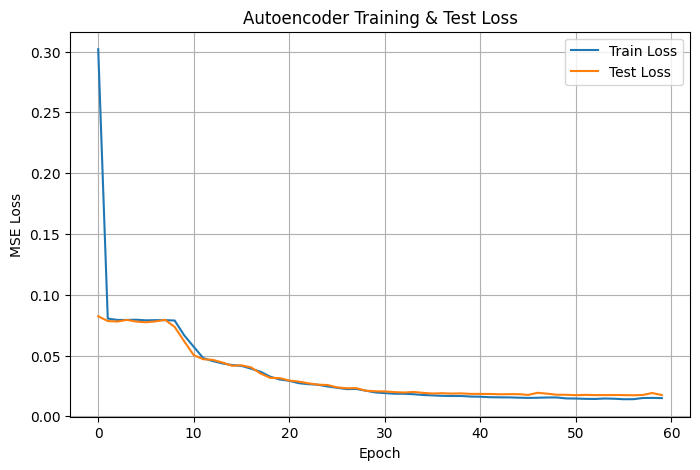

In [25]:
plt.figure(figsize=(8,5))
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('Autoencoder Training & Test Loss')
plt.legend()
plt.grid(True)
plt.show()

# Reconstruction loss analysis

In [27]:
with torch.no_grad():
    reconstructed = model(train_tensor.to(device))
    
criterion_per_element = nn.MSELoss(reduction='none')
per_element_loss = criterion_per_element(reconstructed, train_tensor.to(device))
per_vec_loss = per_element_loss.mean(dim=1)

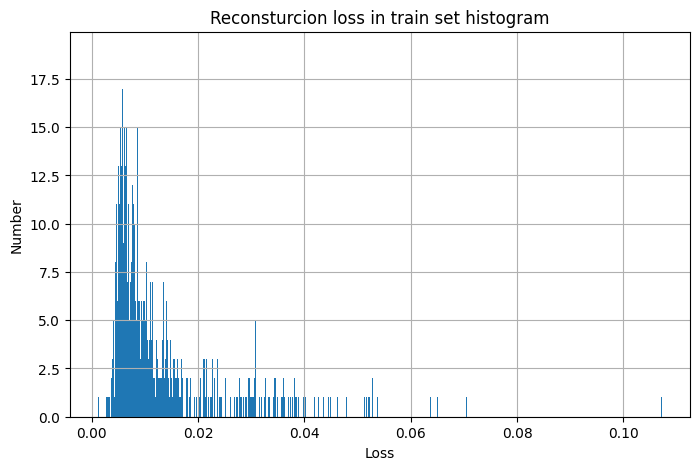

In [28]:
plt.figure(figsize=(8,5))
plt.hist(per_vec_loss.cpu(),bins=len(per_vec_loss))
plt.xlabel('Loss')
plt.ylabel('Number')
plt.title('Reconsturcion loss in train set histogram')
plt.grid(True)
plt.show()

In [29]:
top10_loss_values, top10_indices = torch.topk(per_vec_loss, 10)

In [30]:
top10_indices

tensor([ 488,  158, 1207,   93, 1156,   16,  880,   12,  704,  827],
       device='cuda:0')

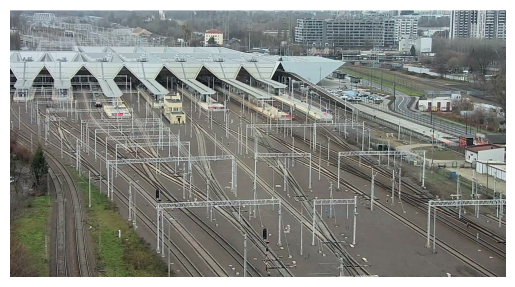

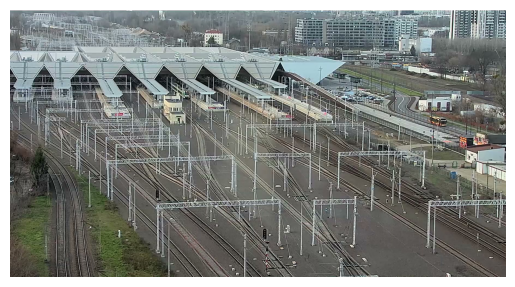

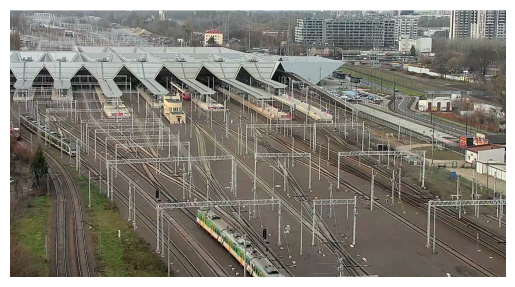

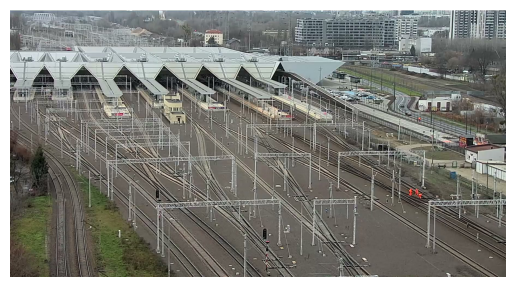

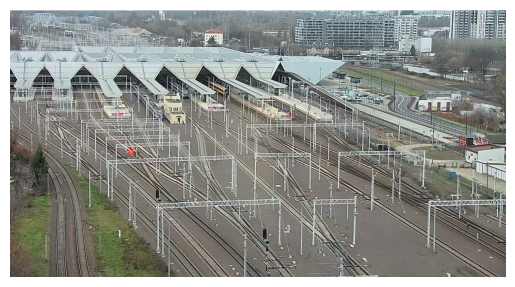

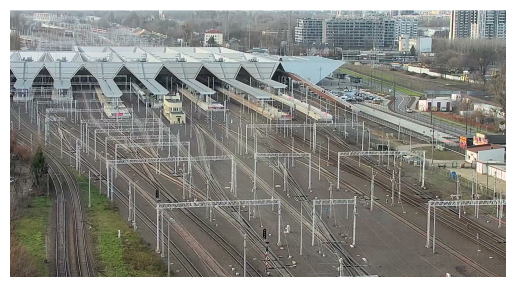

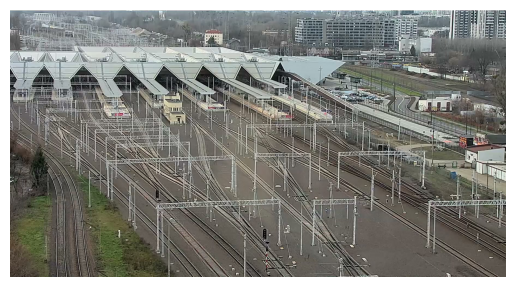

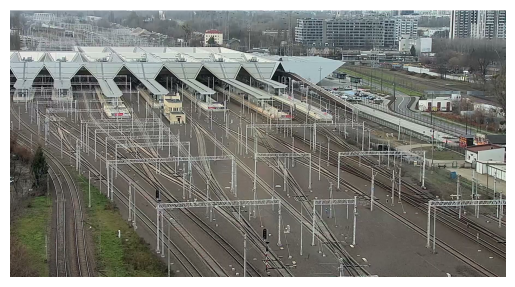

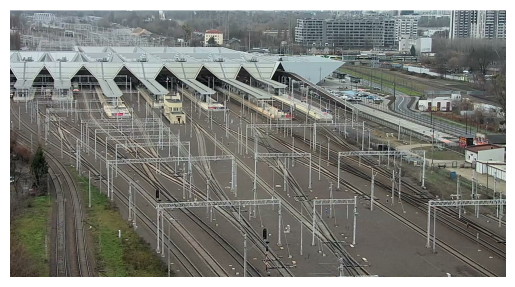

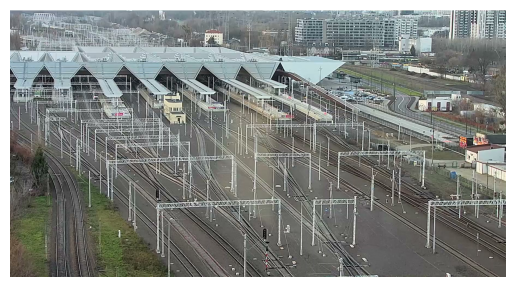

In [31]:
for i in top10_indices:
    plt.imshow(images[i])
    plt.axis('off')
    plt.show()

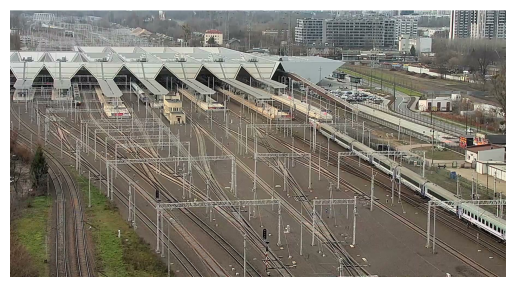

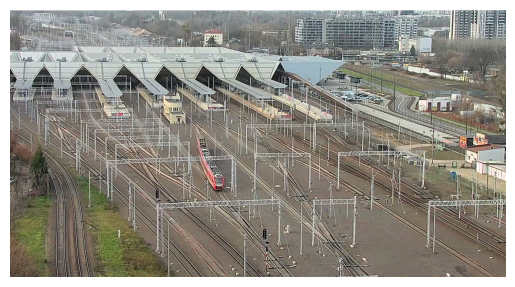

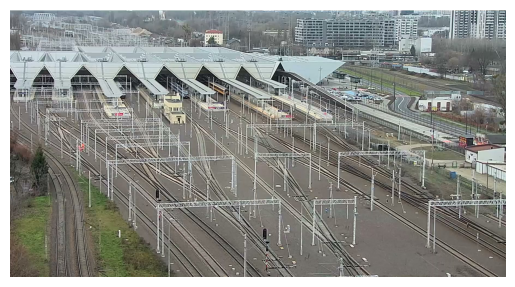

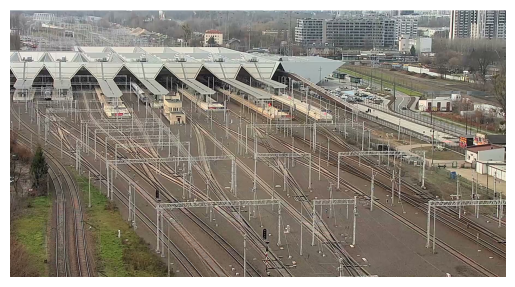

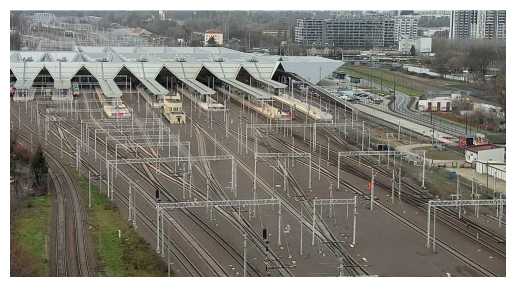

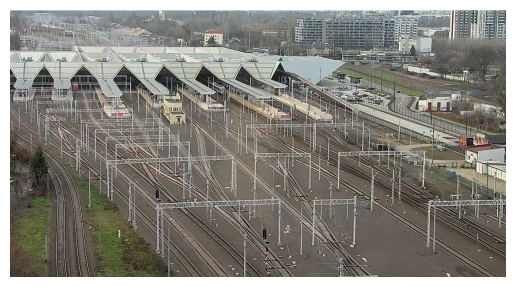

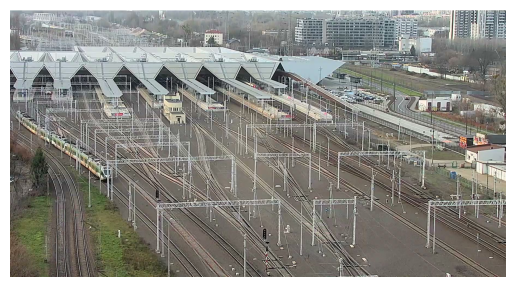

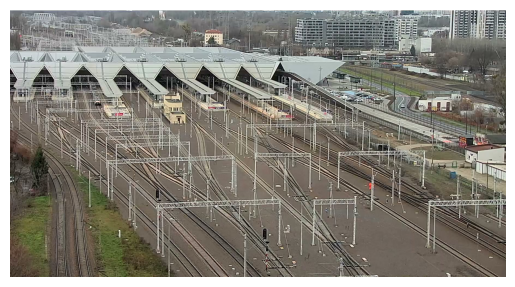

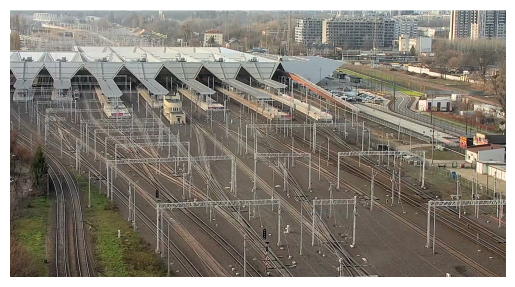

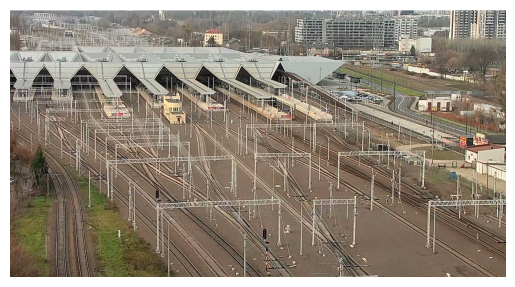

In [32]:
import random
for i in random.sample(range(0, len(train_images)),10):
    plt.imshow(images[i])
    plt.axis('off')
    plt.show()

# Latent space analysis

In [44]:
with torch.no_grad():
    train_latent = model.get_latent(train_tensor.to(device))

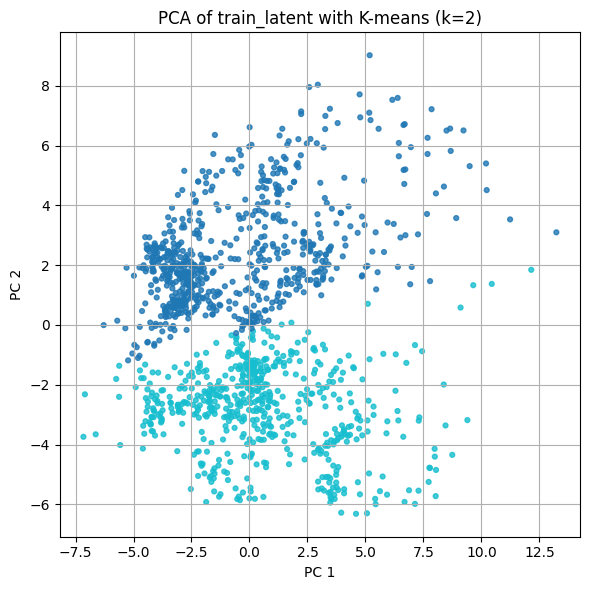

In [45]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Move tensor to CPU and convert to numpy
X = train_latent.detach().cpu().numpy()

# ---- K-means clustering (k=2) ----
kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X)  # shape: (N,)

# ---- PCA to 2D ----
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# ---- Plot ----
plt.figure(figsize=(6, 6))


plt.xlabel("PC 1")
plt.ylabel("PC 2")
plt.title("PCA of train_latent with K-means (k=2)")
plt.scatter(
    X_pca[:, 0],
    X_pca[:, 1],
    c=clusters,
    cmap="tab10",
    s=12,
    alpha=0.8
)

plt.grid(True)
plt.tight_layout()
plt.show()